In [1]:
library(ggplot2)
library(gridExtra)
library(reshape)
library(repr)
library(plotly)
options(repr.plot.width=16, repr.plot.height=8)
read.tcsv = function(file, header=TRUE, sep=",", ...) {
  
  n = max(count.fields(file, sep=sep), na.rm=TRUE)
  x = readLines(file)
  
  .splitvar = function(x, sep, n) {
    var = unlist(strsplit(x, split=sep))
    length(var) = n
    return(var)
  }
  
  x = do.call(cbind, lapply(x, .splitvar, sep=sep, n=n))
  x = apply(x, 1, paste, collapse=sep) 
  ## empty strings are converted to NA
  out = read.csv(text=x, sep=sep, header=header, na.strings = "", ...)
  return(out)
  
}


Attaching package: ‘plotly’


The following object is masked from ‘package:reshape’:

    rename


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




In [2]:
airTravel <- read.tcsv("./data/air_travel_passengers_usafacts.csv")
airTravel <- airTravel[,c(1,2,3)] # remove extra notes in data file
names(airTravel) <- c("date","raw","avg")
airMelt <- melt(airTravel,id=c("date"))
head(airTravel)
head(airMelt)

,date,raw,avg
,<fct>,<int>,<dbl>
1,2020-03-01,2280522,0
2,2020-03-02,2089641,0
3,2020-03-03,1736393,0
4,2020-03-04,1877401,0
5,2020-03-05,2130015,0
6,2020-03-06,2198517,0


,date,variable,value
,<fct>,<fct>,<dbl>
1,2020-03-01,raw,2280522
2,2020-03-02,raw,2089641
3,2020-03-03,raw,1736393
4,2020-03-04,raw,1877401
5,2020-03-05,raw,2130015
6,2020-03-06,raw,2198517


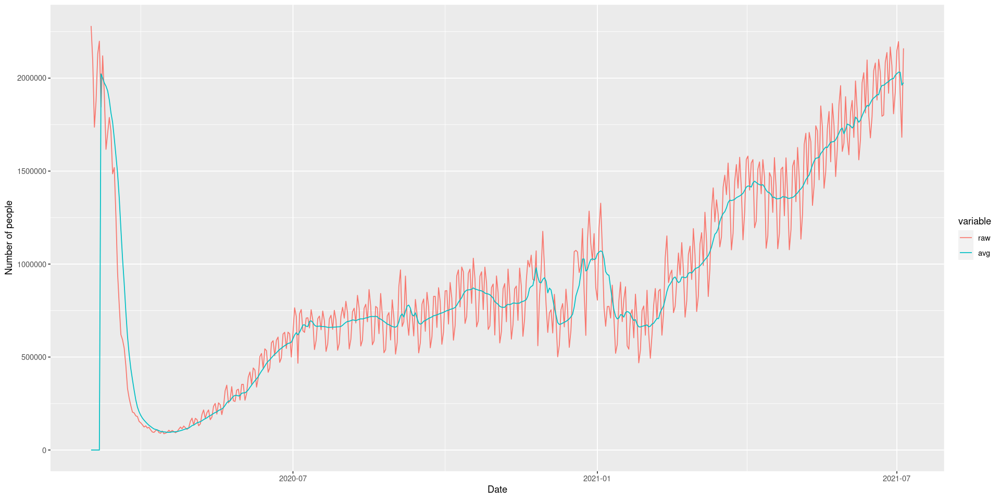

In [3]:
ggplot(data=airMelt)+geom_line(aes(x=as.Date(date),y=value,color=variable))+
    xlab("Date")+
    ylab("Number of people")
    

In [4]:
covidCounty <- read.csv("./data/covid_confirmed_usafacts.csv")
head(covidCounty)
covidCountyMelt <- melt(covidCounty, id=c("countyFIPS","CountyName","State","StateFIPS"))
names(covidCountyMelt) <- c("countyFIPS","CountyName","State","StateFIPS","date","count")
covidCountyMelt$date <- gsub("X","",as.character(covidCountyMelt$date))
covidCountyMelt$date <- as.Date(covidCountyMelt$date, format="%Y.%m.%d")
head(covidCountyMelt)

,countyFIPS,CountyName,State,StateFIPS,X2020.01.22,X2020.01.23,X2020.01.24,X2020.01.25,X2020.01.26,X2020.01.27,⋯,X2021.06.22,X2021.06.23,X2021.06.24,X2021.06.25,X2021.06.26,X2021.06.27,X2021.06.28,X2021.06.29,X2021.06.30,X2021.07.01
,<int>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,1001,Autauga County,AL,1,0,0,0,0,0,0,⋯,7242,7244,7244,7244,7244,7244,7247,7247,7257,7257
3,1003,Baldwin County,AL,1,0,0,0,0,0,0,⋯,21901,21921,21921,21945,21945,21945,21985,21985,22027,22027
4,1005,Barbour County,AL,1,0,0,0,0,0,0,⋯,2345,2344,2344,2344,2344,2344,2345,2345,2346,2346
5,1007,Bibb County,AL,1,0,0,0,0,0,0,⋯,2685,2686,2686,2686,2686,2686,2687,2687,2693,2693
6,1009,Blount County,AL,1,0,0,0,0,0,0,⋯,6950,6957,6957,6967,6967,6967,6975,6975,6987,6987


,countyFIPS,CountyName,State,StateFIPS,date,count
,<int>,<fct>,<fct>,<int>,<date>,<int>
1,0,Statewide Unallocated,AL,1,2020-01-22,0
2,1001,Autauga County,AL,1,2020-01-22,0
3,1003,Baldwin County,AL,1,2020-01-22,0
4,1005,Barbour County,AL,1,2020-01-22,0
5,1007,Bibb County,AL,1,2020-01-22,0
6,1009,Blount County,AL,1,2020-01-22,0


In [9]:
plot <- ggplot(data=covidCountyMelt[covidCountyMelt$State=="OH",])+geom_line(aes(x=date,y=count,color=CountyName))
embed_notebook(ggplotly(plot), height="500")

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+CjxodG1sPgo8aGVhZD4KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+Cjx0aXRsZT5wbG90bHk8L3RpdGxlPgo8c2NyaXB0PihmdW5jdGlvbigpIHsKICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhCiAgLy8gbmV3IG9iamVjdC4gVGhpcyBhbGxvd3MgcHJlY2VkaW5nIGNvZGUgdG8gc2V0IG9wdGlvbnMgdGhhdCBhZmZlY3QgdGhlCiAgLy8gaW5pdGlhbGl6YXRpb24gcHJvY2VzcyAodGhvdWdoIG5vbmUgY3VycmVudGx5IGV4aXN0KS4KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307CgogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIGEgdmlld2VyIHBhbmUuIElmIG5vdCwgd2UncmUgaW4gYSB3ZWIgYnJvd3Nlci4KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0KICAgICAgL1xidmlld2VyX3BhbmU9MVxiLy50ZXN0KHdpbmRvdy5sb2NhdGlvbik7CgogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4KICAvLyBOb3RlIHRoYXQgc3RhdGljIHdpZGdldHMgY2FuIGFwcGVhciBpbiBib3RoIFNoaW55IGFuZCBzdGF0aWMgbW9kZXMsIGJ1dAogIC8vIG9idmlvdXNseSwgU2hpbnkgd2lkZ2V0cyBjYW4gb25seSBhcHBlYXIgaW4gU2hpbnkgYXBwcy9kb2N1bWVudHMuCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQogICAgICB0eXBlb2Yod2luZG93LlNoaW55KSAhPT0gInVuZGVmaW5lZCIgJiYgISF3aW5kb3cuU2hpbnkub3V0cHV0QmluZGluZ3M7CgogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duCiAgLy8gdmVyc2lvbiBpZiBuZWNlc3NhcnkuCiAgZnVuY3Rpb24gcXVlcnlTZWxlY3RvckFsbChzY29wZSwgc2VsZWN0b3IpIHsKICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsKICAgICAgcmV0dXJuIHNjb3BlLmZpbmQoc2VsZWN0b3IpOwogICAgfQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsKICAgICAgcmV0dXJuIHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwoc2VsZWN0b3IpOwogICAgfQogIH0KCiAgZnVuY3Rpb24gYXNBcnJheSh2YWx1ZSkgewogICAgaWYgKHZhbHVlID09PSBudWxsKQogICAgICByZXR1cm4gW107CiAgICBpZiAoJC5pc0FycmF5KHZhbHVlKSkKICAgICAgcmV0dXJuIHZhbHVlOwogICAgcmV0dXJuIFt2YWx1ZV07CiAgfQoKICAvLyBJbXBsZW1lbnQgalF1ZXJ5J3MgZXh0ZW5kCiAgZnVuY3Rpb24gZXh0ZW5kKHRhcmdldCAvKiwgLi4uICovKSB7CiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7CiAgICAgIHJldHVybiB0YXJnZXQ7CiAgICB9CiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgewogICAgICB2YXIgc291cmNlID0gYXJndW1lbnRzW2ldOwogICAgICBmb3IgKHZhciBwcm9wIGluIHNvdXJjZSkgewogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsKICAgICAgICAgIHRhcmdldFtwcm9wXSA9IHNvdXJjZVtwcm9wXTsKICAgICAgICB9CiAgICAgIH0KICAgIH0KICAgIHJldHVybiB0YXJnZXQ7CiAgfQoKICAvLyBJRTggZG9lc24ndCBzdXBwb3J0IEFycmF5LmZvckVhY2guCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7CiAgICBpZiAodmFsdWVzLmZvckVhY2gpIHsKICAgICAgdmFsdWVzLmZvckVhY2goY2FsbGJhY2ssIHRoaXNBcmcpOwogICAgfSBlbHNlIHsKICAgICAgZm9yICh2YXIgaSA9IDA7IGkgPCB2YWx1ZXMubGVuZ3RoOyBpKyspIHsKICAgICAgICBjYWxsYmFjay5jYWxsKHRoaXNBcmcsIHZhbHVlc1tpXSwgaSwgdmFsdWVzKTsKICAgICAgfQogICAgfQogIH0KCiAgLy8gUmVwbGFjZXMgdGhlIHNwZWNpZmllZCBtZXRob2Qgd2l0aCB0aGUgcmV0dXJuIHZhbHVlIG9mIGZ1bmNTb3VyY2UuCiAgLy8KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbgogIC8vIHRoYXQgUkVUVVJOUyB0aGUgbmV3IG1ldGhvZC4gZnVuY1NvdXJjZSByZWNlaXZlcyBhIHNpbmdsZSBhcmd1bWVudCB0aGF0IGlzCiAgLy8gdGhlIG92ZXJyaWRkZW4gbWV0aG9kLCBpdCBjYW4gYmUgY2FsbGVkIGZyb20gdGhlIG5ldyBtZXRob2QuIFRoZSBvdmVycmlkZGVuCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5CiAgLy8gYm91bmQgdG8gaXQgc28gInRoaXMiIHdpbGwgd29yayBjb3JyZWN0bHkuCiAgZnVuY3Rpb24gb3ZlcnJpZGVNZXRob2QodGFyZ2V0LCBtZXRob2ROYW1lLCBmdW5jU291cmNlKSB7CiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307CiAgICB2YXIgc3VwZXJGdW5jQm91bmQgPSBmdW5jdGlvbigpIHsKICAgICAgcmV0dXJuIHN1cGVyRnVuYy5hcHBseSh0YXJnZXQsIGFyZ3VtZW50cyk7CiAgICB9OwogICAgdGFyZ2V0W21ldGhvZE5hbWVdID0gZnVuY1NvdXJjZShzdXBlckZ1bmNCb3VuZCk7CiAgfQoKICAvLyBBZGQgYSBtZXRob2QgdG8gZGVsZWdhdG9yIHRoYXQsIHdoZW4gaW52b2tlZCwgY2FsbHMKICAvLyBkZWxlZ2F0ZWUubWV0aG9kTmFtZS4gSWYgdGhlcmUgaXMgbm8gc3VjaCBtZXRob2Qgb24KICAvLyB0aGUgZGVsZWdhdGVlLCBidXQgdGhlcmUgd2FzIG9uZSBvbiBkZWxlZ2F0b3IgYmVmb3JlCiAgLy8gZGVsZWdhdGVNZXRob2Qgd2FzIGNhbGxlZCwgdGhlbiB